# Data Ingestion & Wrangling

## 1. Property and Unit Data
### Shoutout to whoever this person is: https://github.com/adinutzyc21/apartments-scraper for the scraper which saved us a lot of time and effort. Here is a screenshot of the scraped data from the linked code:

We found a scraper that:
1. Scraped Apartments.com [for all of the properties and units we wanted to import](https://github.com/tmilse/DMV/blob/master/code/ScrapeUnitData.py)
2. [Clean the property-level data](https://github.com/tmilse/DMV/blob/master/code/WranglePropertyFunctions.py) into an ingestible format
3. [Clean the unit-level data](https://github.com/tmilse/DMV/blob/master/code/WrangleUnitFunctions.py) into an ingestible format

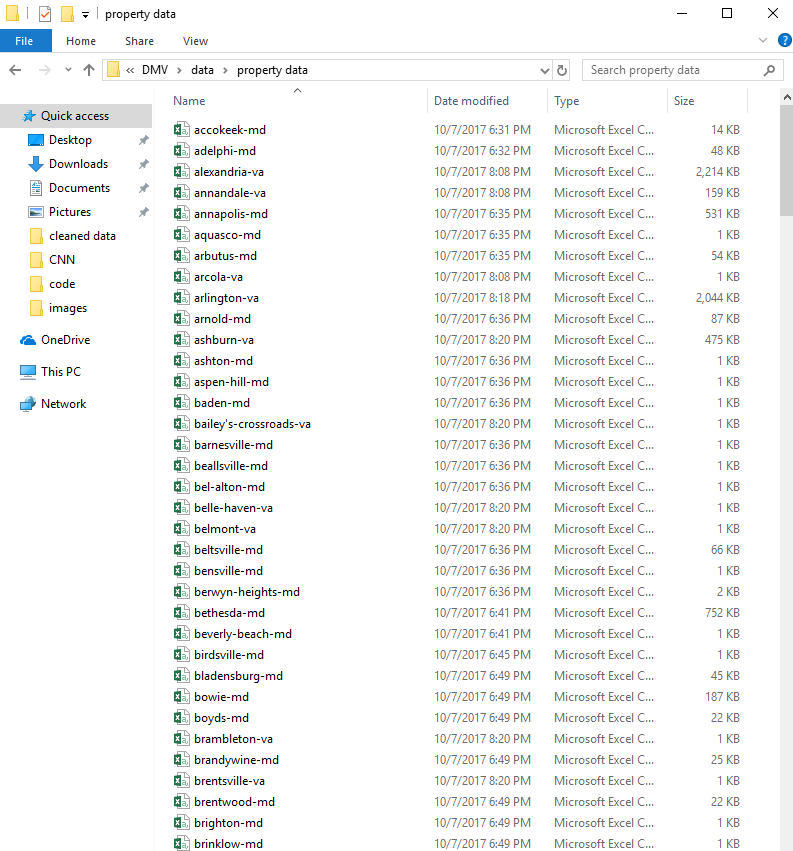

In [1]:
from IPython.display import Image
file = 'C:\\Users\\NKallfa\\Desktop\\Documents\\Georgetown Data Science Certificate\\DMV\\presentation\\images\\'
Image(filename=file + 'city_files.png')

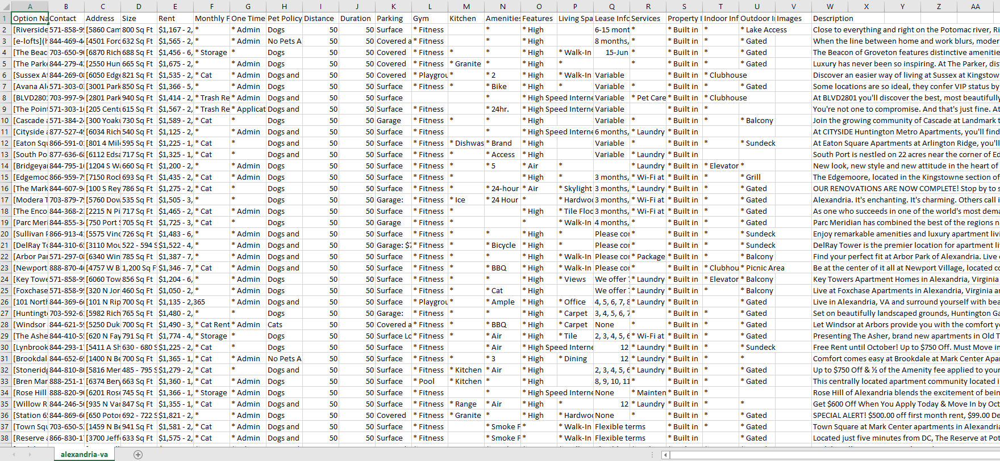

In [2]:
from IPython.display import Image
file = 'C:\\Users\\NKallfa\\Desktop\\Documents\\Georgetown Data Science Certificate\\DMV\\presentation\\images\\'
Image(filename=file + 'Alexandria_CSV.png')

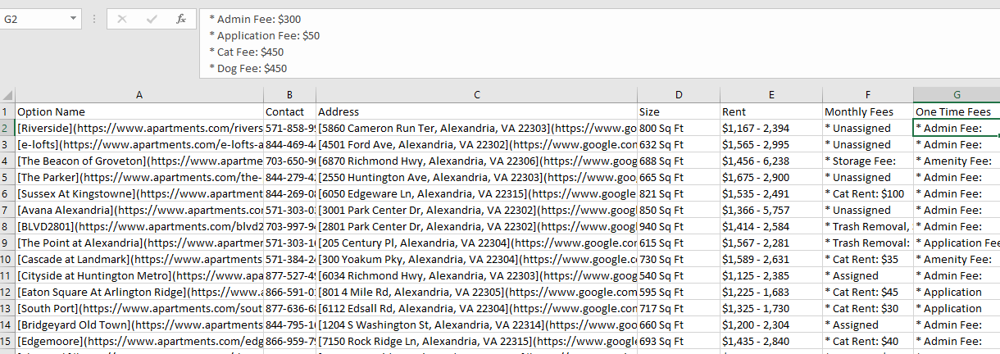

In [1]:
from IPython.display import Image
file = 'C:\\Users\\NKallfa\\Desktop\\Documents\\Georgetown Data Science Certificate\\DMV\\presentation\\images\\'
Image(filename=file + 'Alexandria_CSV_Close_Up.png')

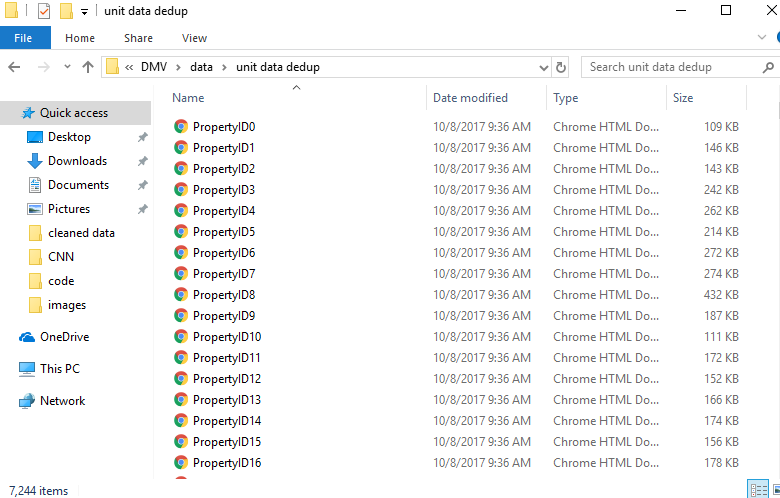

In [3]:
from IPython.display import Image
file = 'C:\\Users\\NKallfa\\Desktop\\Documents\\Georgetown Data Science Certificate\\DMV\\presentation\\images\\'
Image(filename=file + 'Unit_Files.png')

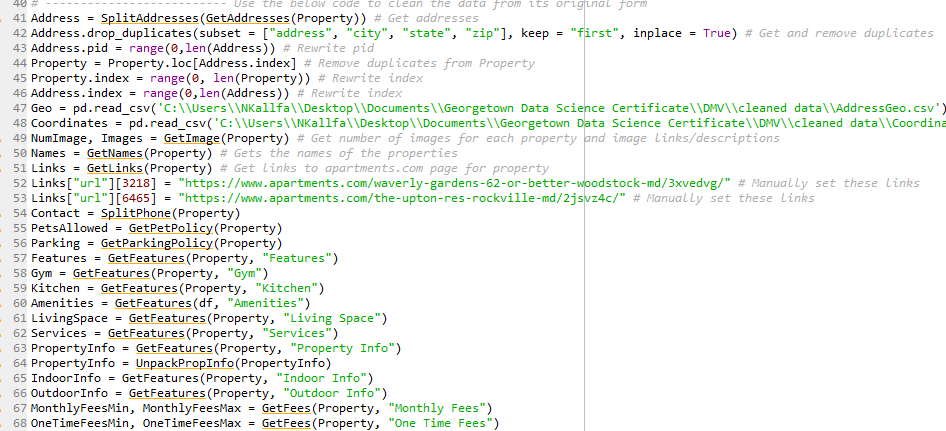

In [4]:
from IPython.display import Image
file = 'C:\\Users\\NKallfa\\Desktop\\Documents\\Georgetown Data Science Certificate\\DMV\\presentation\\images\\'
Image(filename=file + 'Custom_Cleaning_Functions.png')

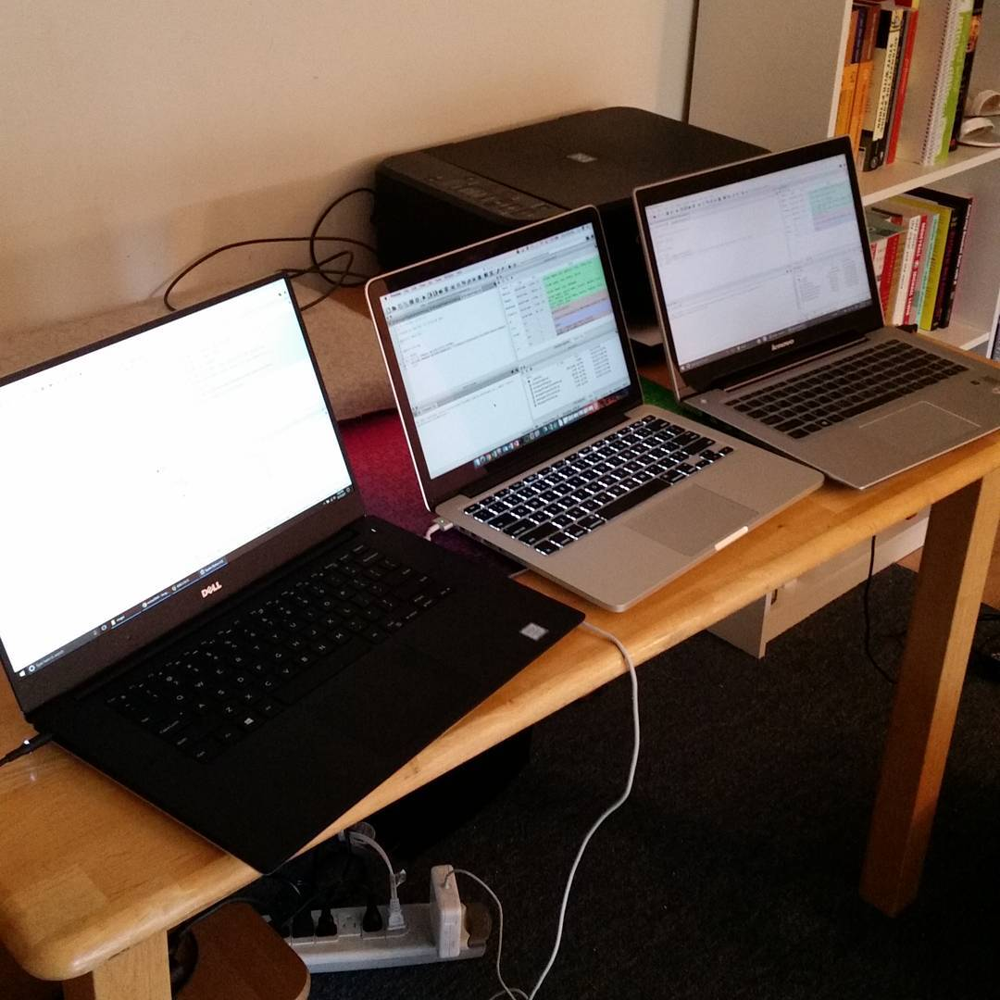

In [7]:
from IPython.display import Image
file = 'C:\\Users\\NKallfa\\Desktop\\Documents\\Georgetown Data Science Certificate\\DMV\\presentation\\images\\'
Image(filename=file + 'Image_Scraping.jpg')

# 2. Demographic Data

We downloaded several demographic data from [the US Census Bureau's American Fact Finder](https://factfinder.census.gov/faces/nav/jsf/pages/index.xhtml)

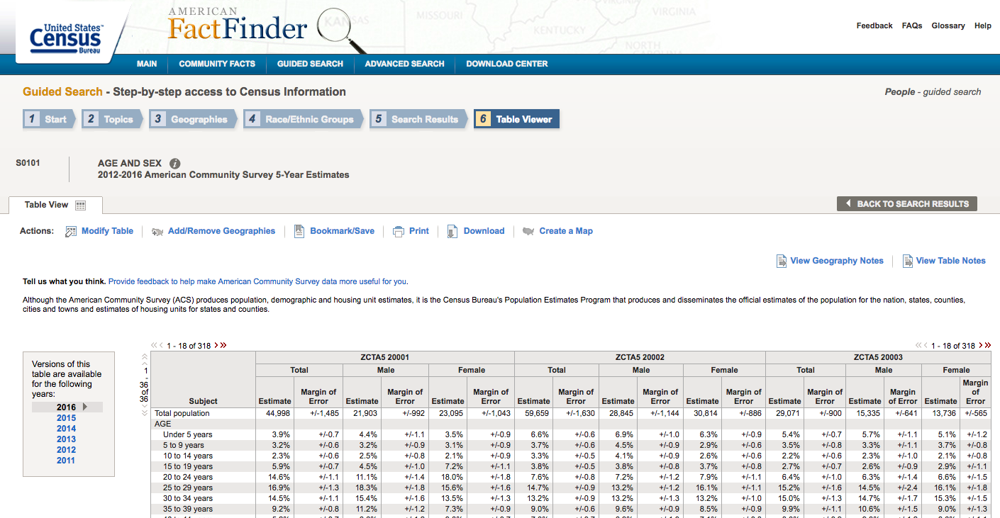

In [2]:
from IPython.display import Image
file = '/Users/sanemkabaca/Desktop/'
Image(filename=file + 'american_fact_finder.png')

1. These are exported from the website as CSVs
2. We create a [Python script](https://github.com/tmilse/DMV/blob/master/code/Census_Wrangle.py) to clean the data by:
    - Selecting the Virginia, Maryland, and DC zip codes that matched to the properties we imported
    - Imputed missing values with medians
    - Selected only the columns we would use
3. Resulted in 10 demographic tables:
    - Age
    - Sex
    - Education
    - Employment
    - Healthcare
    - Income
    - Marital
    - Poverty
    - Race
    - Social

# 3. Put it all Together

We used MySQL and Sequel Pro to import and join unit-level data to property-level data via a unique property identifier. Then that aggregated data was combined to the demographic tables via zip code to create one master 

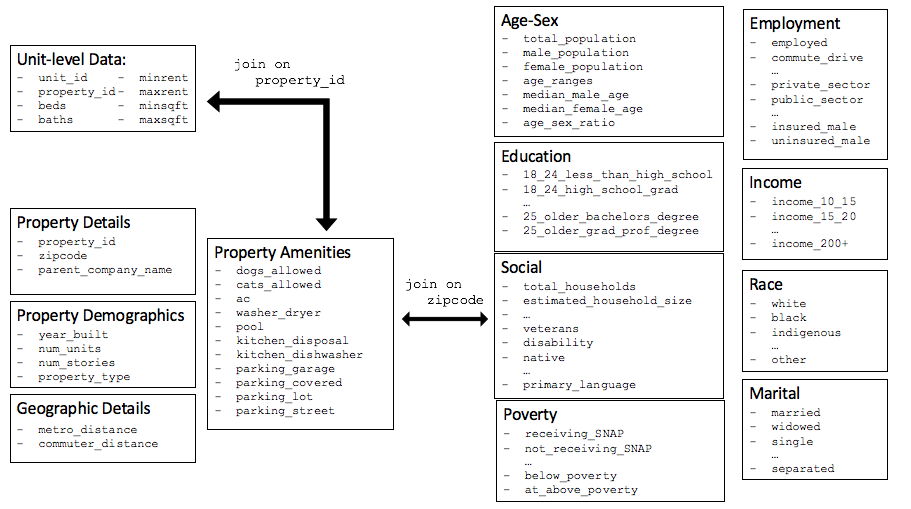

In [4]:
from IPython.display import Image
file = '/Users/sanemkabaca/Desktop/'
Image(filename=file + 'sql_schema.png')

# 4. Explore and Visualize

Locations for all of the properties

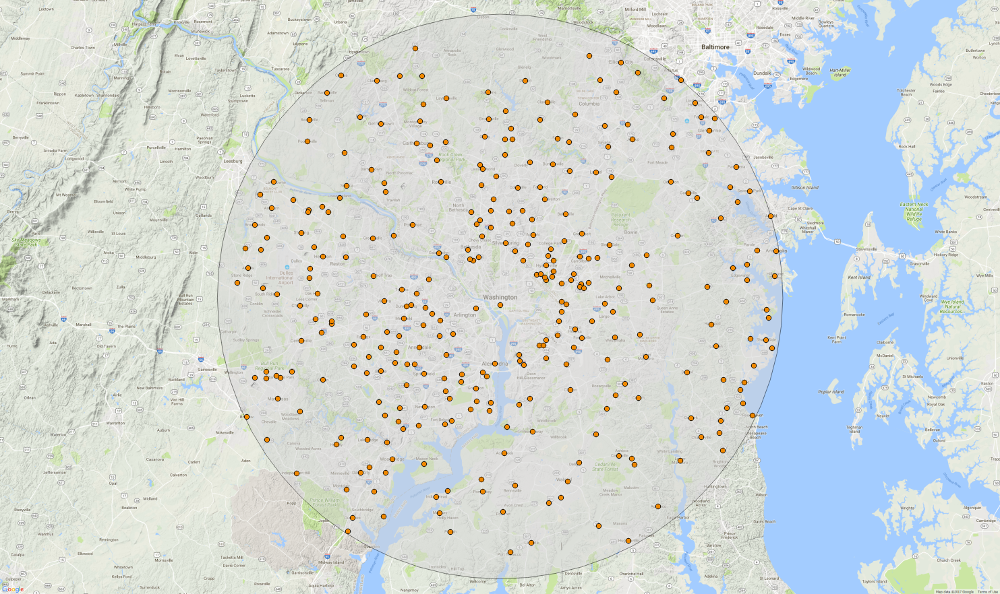

In [5]:
from IPython.display import Image
file = '/Users/sanemkabaca/Documents/Georgetown/'
Image(filename=file + 'property_pictures.png')

In [16]:
import MySQLdb
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

dsn_database = "property"
dsn_hostname = "georgetownanalyticscapstone.c50pz9jksixq.us-east-1.rds.amazonaws.com"
dsn_port = 3306
dsn_uid = "sanemkabaca"
dsn_pwd = "georgetowndmv"

db_connection = MySQLdb.connect(host=dsn_hostname, port=dsn_port, user=dsn_uid, passwd=dsn_pwd, db=dsn_database)

query = ("""SELECT * FROM full_dataset""")
query1 = ("""SELECT * FROM property.property_type""")
df_type = pd.read_sql(query1, con = db_connection)

query2 = ("""SELECT * FROM property.property_address""")
df_address = pd.read_sql(query2, con = db_connection)

query3 = ("""SELECT * FROM property.property_units""")
df_units = pd.read_sql(query3, con = db_connection)

df = pd.read_sql(query, con=db_connection)
df.head()


,unit_id,pid,property_name,zip_code,minrent,maxrent,beds,baths,minsqft,maxsqft,...,poverty_per_house_rec_SNAP_type_fam_unmarried,poverty_per_house_norec_SNAP_type_fam_unmarried,poverty_per_house_type_not_fam,poverty_per_house_rec_SNAP_type_not_fam,poverty_per_house_norec_SNAP_type_not_fam,poverty_per_house_type_w_children,poverty_per_house_rec_SNAP_type_w_children,poverty_per_house_norec_SNAP_type_w_children,poverty_per_house_poverty_below,poverty_per_house_poverty_at_above
0,1,0,1801 Catherine Fran Dr,20607,1300.0,1300.0,2,1,1500,1500,...,9.9,19.4,15.4,32.2,14.8,40.3,33.9,40.5,2.4,97.6
1,2,1,17211 Summerwood Ln,20607,3000.0,3000.0,4,5,5002.240151,5002.240151,...,9.9,19.4,15.4,32.2,14.8,40.3,33.9,40.5,2.4,97.6
2,3,2,911 Strausberg St,20607,3000.0,3000.0,4,4,3159.504746,3159.504746,...,9.9,19.4,15.4,32.2,14.8,40.3,33.9,40.5,2.4,97.6
3,4,3,Daniel's Run,20783,1415.0,1470.0,1,1,725,725,...,57.5,30.6,30.1,10.1,32.7,42.6,78.4,38.1,13,87
4,5,3,Daniel's Run,20783,1470.0,1470.0,1,1,725,725,...,57.5,30.6,30.1,10.1,32.7,42.6,78.4,38.1,13,87


In [12]:
print("Number of Units:",df_units.shape)
print("Number of Null Rent Values:",pd.isnull(df_units.minrent).sum())

Number of Units: (36273, 8)
Number of Null Rent Values: 6552


### Properties by State

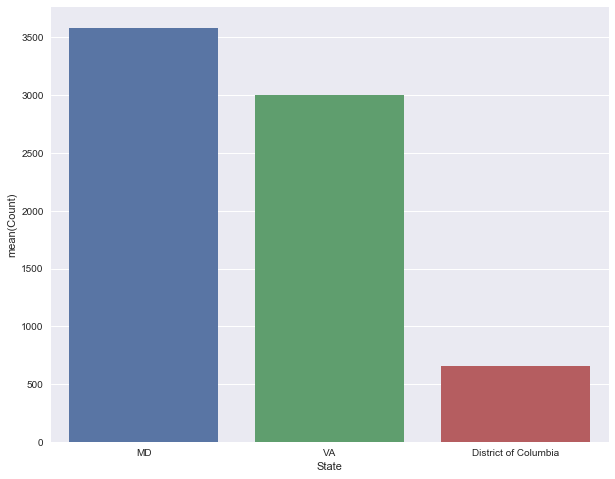

In [17]:
df_address.state = df_address.state.apply(lambda x: x.strip())
count_state = df_address.state.value_counts()

count_state = pd.DataFrame(count_state).reset_index().rename(columns = {"index":"State","state":"Count"})

plt.figure(figsize=(10, 8))
sns.barplot(x = "State", y = "Count", data = count_state)

### Count of Properties by Type

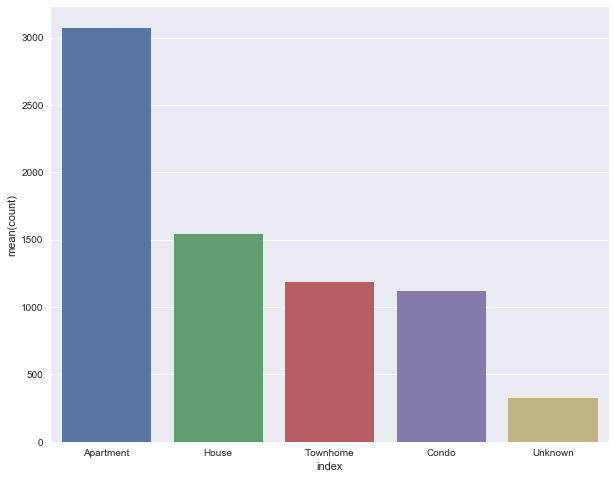

In [18]:
type_count = df_type.type.value_counts().to_frame("count").reset_index().rename({"index":"type"})

plt.figure(figsize=(10, 8))
sns.barplot(x = "index", y = "count", data = type_count)

### Properties by beds

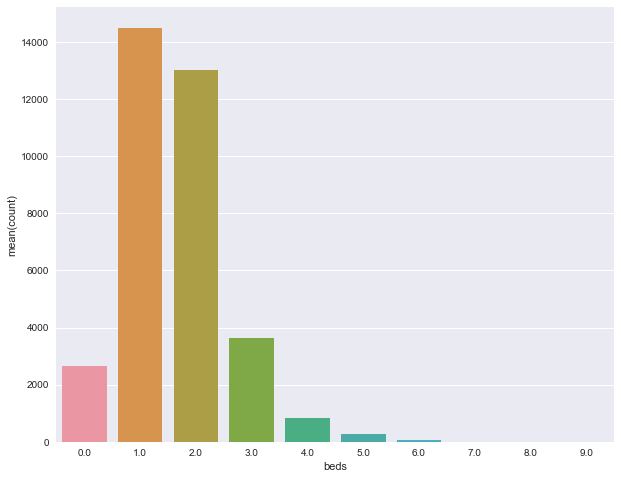

In [19]:
bed_counts = df_units.beds.value_counts().to_frame("count").reset_index()
bed_counts = bed_counts.rename(index=str, columns={"index": "beds"})

plt.figure(figsize=(10, 8))
sns.barplot(x = "beds", y = "count", data = bed_counts)

### Properties by Baths

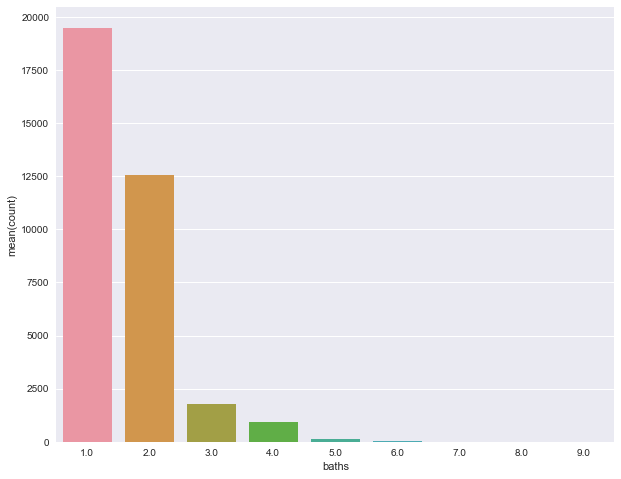

In [20]:
bath_counts = df_units.baths.value_counts().to_frame("count").reset_index()
bath_counts = bath_counts.rename(index=str, columns={"index": "baths"})

plt.figure(figsize=(10, 8))
sns.barplot(x = "baths", y = "count", data = bath_counts)

### Beds vs. Average Rent

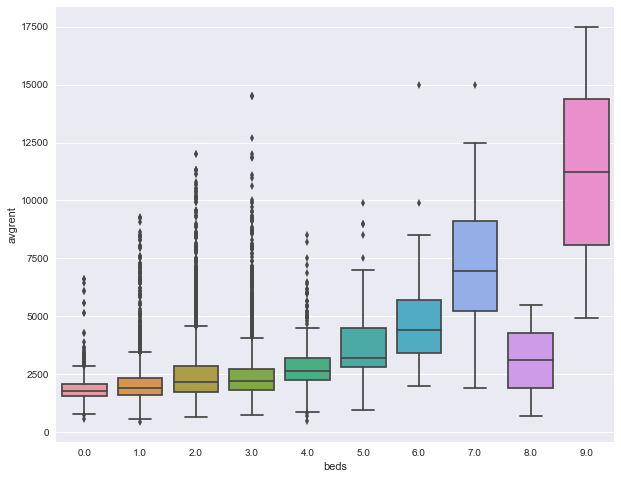

In [22]:
df_units

df_units["avgrent"] = (df_units.minrent + df_units.maxrent)/2

plt.figure(figsize=(10, 8))
sns.boxplot(x = "beds", y = "avgrent", data = df_units)

### State vs. Average Rent

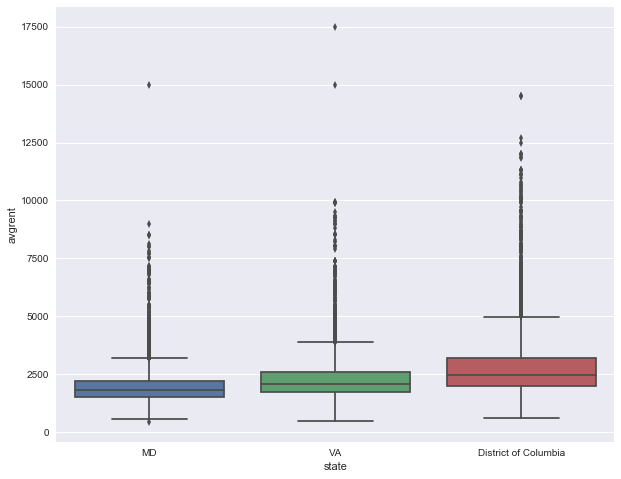

In [23]:
df_units["avgrent"] = (df_units.minrent + df_units.maxrent)/2

address_unit = df_address.join(df_units.set_index("pid"), on = "pid", how = "inner", rsuffix = "_u")

address_unit.head()
plt.figure(figsize=(10, 8))
sns.boxplot(x = "state", y = "avgrent", data = address_unit)

### Beds vs. Maximum Sq Ft

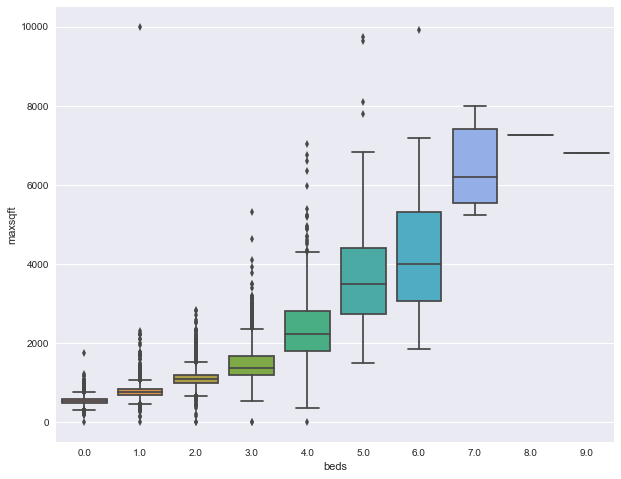

In [24]:
plt.figure(figsize=(10, 8))
sns.boxplot(x = "beds", y = "maxsqft", data = df_units)

### General Property Features

[(0, 1)]

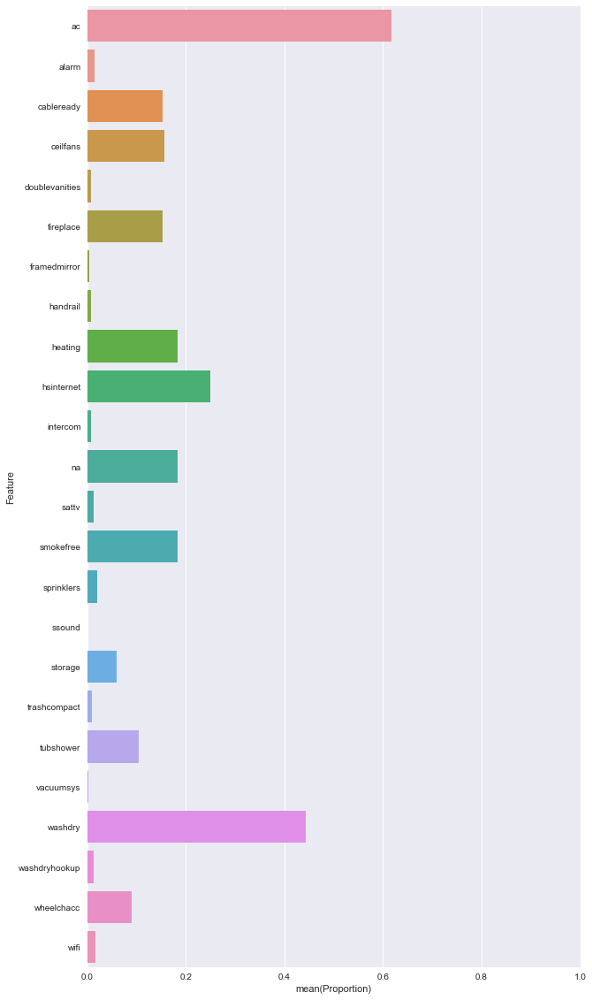

In [27]:
query4 = ("""SELECT * FROM property.property_features""")
df_features = pd.read_sql(query4, con = db_connection)

feature_avg = pd.DataFrame(df_features[list(df_features.columns[1:26])].mean(axis = 0)).reset_index().rename(columns = {"index":"Feature",0:"Proportion"})

plt.figure(figsize=(10, 20))
sns.barplot(y = "Feature", x = "Proportion", data = feature_avg, orient = "h", ).set(xlim = (0,1))

### Distance to Metro vs. Average Rent

[(12, 0)]

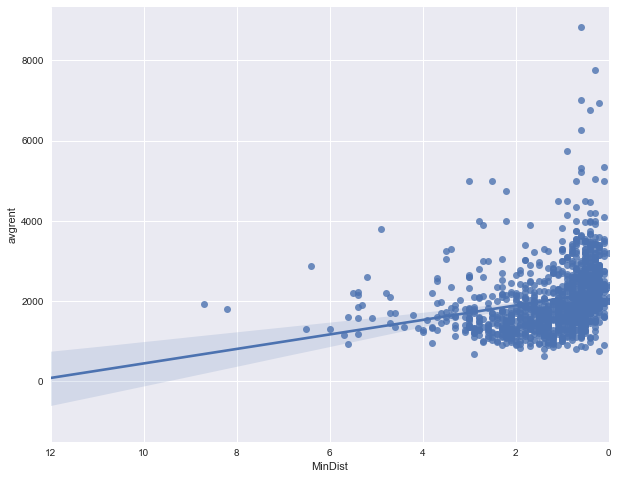

In [34]:
query14 = ("""SELECT * FROM property.property_unit_metro_station""")
df_metro = pd.read_sql(query14, con = db_connection)

df_metro.head()
df_units.head()

metro_unit = df_address.join(df_metro.set_index("pid"), on = "pid", how = "inner", rsuffix = "_u")

metro_unit.reset_index(drop = True, inplace = True)
metro_unit.distance = pd.to_numeric(metro_unit.distance)

NMetro = []
MinDist = []

for i in range(0, len(metro_unit)):
    Missing = pd.isnull(metro_unit.iloc[i,].distance)
    if (Missing == True):
        NMetro.append(0)
        MinDist.append(np.NaN)
    else:
        pid = metro_unit.iloc[i,].pid
        L = len(metro_unit.loc[metro_unit.pid == pid,])
        MinDist_temp = min(metro_unit.loc[metro_unit.pid == pid,].distance)
        NMetro.append(L)
        MinDist.append(MinDist_temp)
        
metro_unit["NMetro"] = NMetro
metro_unit["MinDist"] = MinDist

df_nmetro = metro_unit[["pid", "NMetro","MinDist"]]

df_nmetro = df_nmetro.drop_duplicates(keep = "first").reset_index(drop = True)
df_nmetro2 = df_nmetro.join(df_units.set_index("pid"), on = "pid", how = "inner", rsuffix = "_u")
df_nmetro2 = df_nmetro2[["pid", "NMetro","MinDist","avgrent", "beds", "baths"]]
avg_rent_per_property = pd.DataFrame(df_nmetro2.groupby("pid").avgrent.mean()).reset_index()

df_nmetro_avg_rent = df_nmetro.join(avg_rent_per_property.set_index("pid"), on = "pid", how = "inner", rsuffix = "_avg")

plt.figure(figsize=(10, 8))
sns.regplot(x = "MinDist", y = "avgrent", data = df_nmetro_avg_rent).set(xlim = (12,0))

### Average Rent across Bedrooms

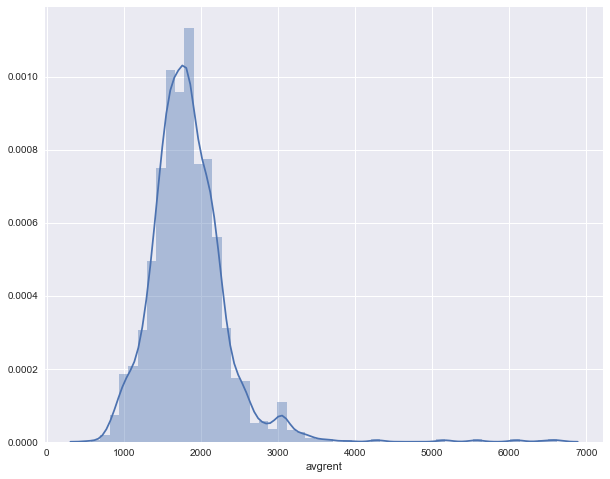

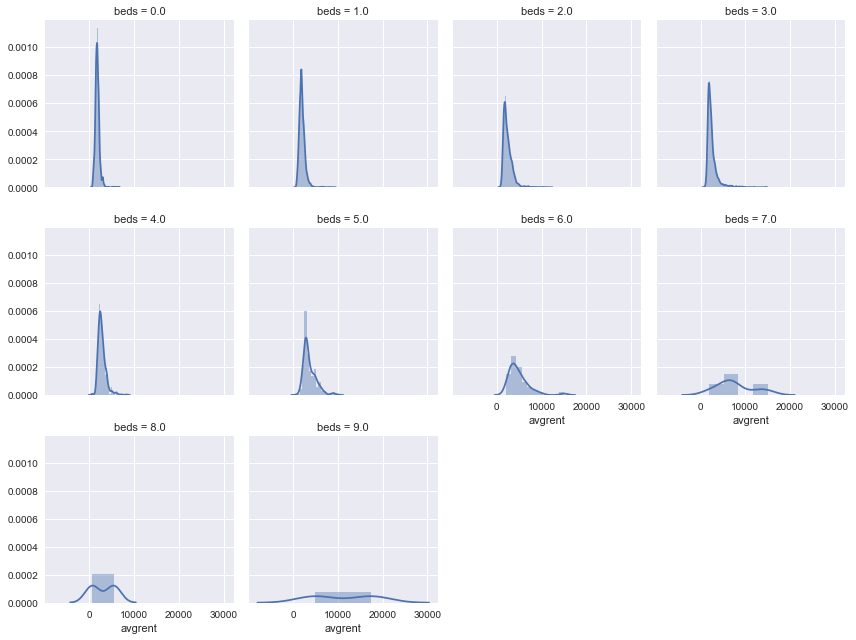

In [35]:
df_0bd = df_units.loc[df_units.beds == 0,]
df_1bd = df_units.loc[df_units.beds == 1,]
df_2bd = df_units.loc[df_units.beds == 2,]
df_3bd = df_units.loc[df_units.beds == 3,]
df_4bd = df_units.loc[df_units.beds == 4,]

plt.figure(figsize=(10, 8))
sns.distplot(a = df_0bd.loc[pd.isnull(df_0bd.avgrent) == False,].avgrent)

g = sns.FacetGrid(df_units, col="beds", col_wrap = 4, size = 3)
g = g.map(sns.distplot, "avgrent")

## Distribution of Maximum Sq Footage in DC

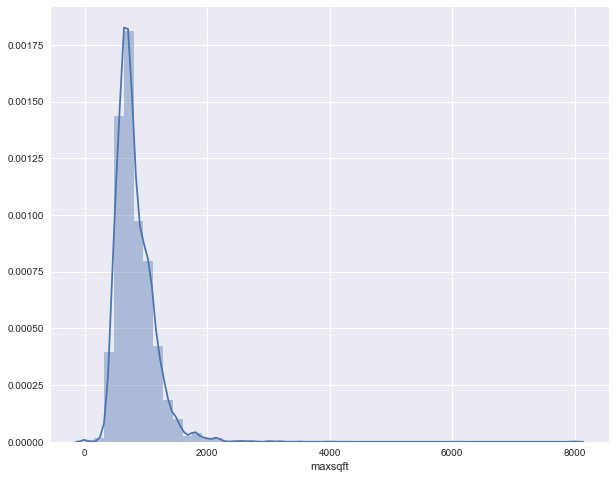

In [36]:
plt.figure(figsize=(10, 8))
sns.distplot(address_unit.loc[(address_unit.state == "District of Columbia") & 
                              (pd.isnull(address_unit.maxsqft) == False),].maxsqft)

### Property demographics

In [38]:
query15 = ("""SELECT * FROM property.property_demographics""")
df_coord = pd.read_sql(query15, con = db_connection)

pd.DataFrame([min(df_coord.yearbuilt[(df_coord.yearbuilt != '')]),
            max(df_coord.nunit[df_coord.nunit != '']),
            max(df_coord.lotsize[df_coord.lotsize != '']),
            max(df_coord.nstory[df_coord.nstory != '']),
            max(df_coord.yearren[df_coord.yearren != '']),
            min(df_coord.yearren[df_coord.yearren != ''])], 
             index = ['Oldest Property','Most Units', 'Largest Lot Size', 'Most Stories', 'Newly Renovated', 'Oldest Renovated'])

,0
Oldest Property,1780.0
Most Units,996.0
Largest Lot Size,6.96
Most Stories,9.0
Newly Renovated,2018.0
Oldest Renovated,1962.0


### Most Expensive Property

In [39]:
query = ("""SELECT * FROM full_dataset""")
df = pd.read_sql(query, con=db_connection)

df.rent = (df.minrent + df.maxrent)/2

df.rent.sort_values(ascending = False) # Index of most expensive property is 20859
df.property_name[20859]

'1289 Ballantrae Farm Dr'

In [40]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url= "https://photos.zillowstatic.com/p_h/ISy3x3nztu34hn0000000000.jpg")

In [41]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url= "https://wdcimagestorageprodeast.blob.core.windows.net/mls249/Large/1000065493_5.jpg")

## Demographic Explorations

In [140]:
query16 = ("""SELECT * FROM demographic_for_visualizations""")
demos = pd.read_sql(query16, con=db_connection)

demos.head()

,zip,age_sex_pop,age_sex_pop_m,age_sex_pop_f,age_sex_pop_under_5,age_sex_pop_5_to_9,age_sex_pop_10_to_14,age_sex_pop_15_to_19,age_sex_pop_20_to_24,age_sex_pop_25_to_29,...,poverty_per_house_norec_SNAP_type_fam_unmarried,poverty_per_house_type_not_fam,poverty_per_house_rec_SNAP_type_not_fam,poverty_per_house_norec_SNAP_type_not_fam,poverty_per_house_type_w_children,poverty_per_house_rec_SNAP_type_w_children,poverty_per_house_norec_SNAP_type_w_children,poverty_per_house_poverty_below,poverty_per_house_poverty_at_above,state
0,20001,43731,21018,22713,4.0,3.0,2.0,6.0,15.0,17.0,...,11.0,65.0,50.0,68.0,15.0,35.0,12.0,15.0,84.0,dc
1,20002,57412,27707,29705,6.0,4.0,3.0,4.0,8.0,15.0,...,13.0,59.0,41.0,62.0,20.0,40.0,16.0,17.0,83.0,dc
2,20003,28538,15194,13344,6.0,3.0,2.0,3.0,8.0,14.0,...,7.0,58.0,48.0,59.0,16.0,31.0,15.0,8.0,92.0,dc
3,20004,1667,882,785,4.0,1.0,1.0,0.0,2.0,14.0,...,2.0,73.0,25.0,73.0,7.0,53.0,7.0,2.0,97.0,dc
4,20005,12947,6920,6027,3.0,1.0,1.0,1.0,7.0,22.0,...,2.0,81.0,87.0,80.0,5.0,0.0,5.0,11.0,88.0,dc


### DC Population

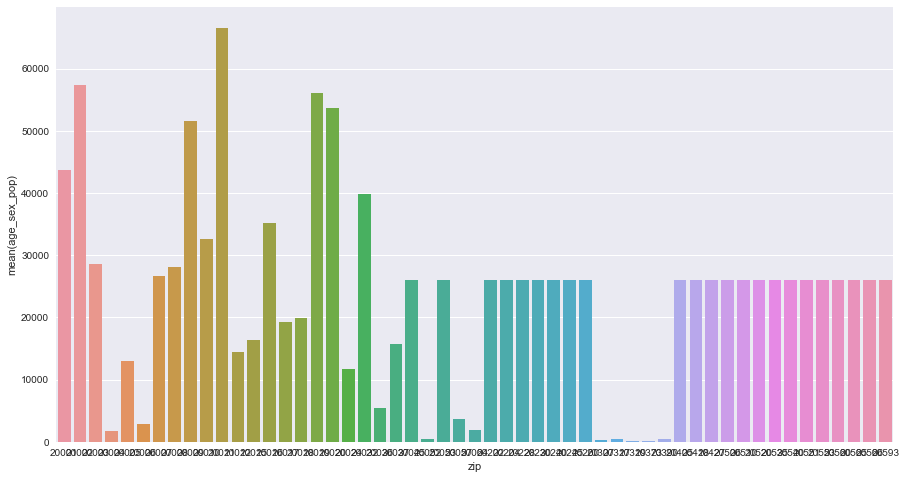

In [159]:
plt.figure(figsize=(15, 8))
sns.barplot(x = "zip", y = "age_sex_pop", data = demos.loc[demos['state'] == 'dc'])

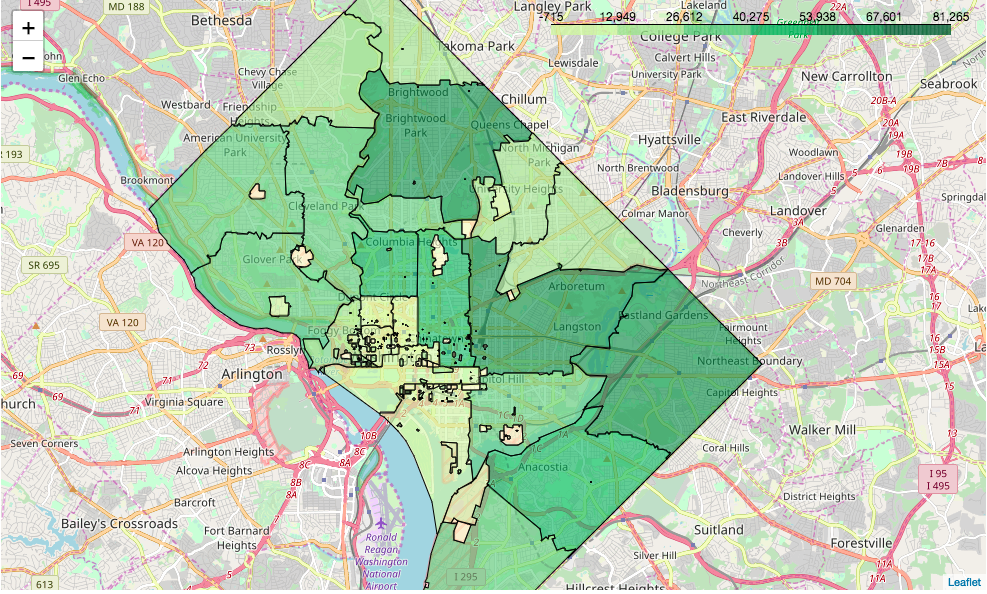

In [175]:
import folium

m = folium.Map(location =[38.8977, -77.0365], zoom_start=12)
m.choropleth(geo_data='zip-codes.geojson', data=demos,
            columns=['zip', 'age_sex_pop'],
            key_on='feature.properties.ZIPCODE',
            #threshold_scale=[0, 10000, 20000, 30000, 40000, 50000, 60000, 80000, 90000],
            fill_color='YlGn')
m

from IPython.display import Image
file = '/Users/sanemkabaca/Desktop/'
Image(filename=file + 'population.png')

## DC median male age

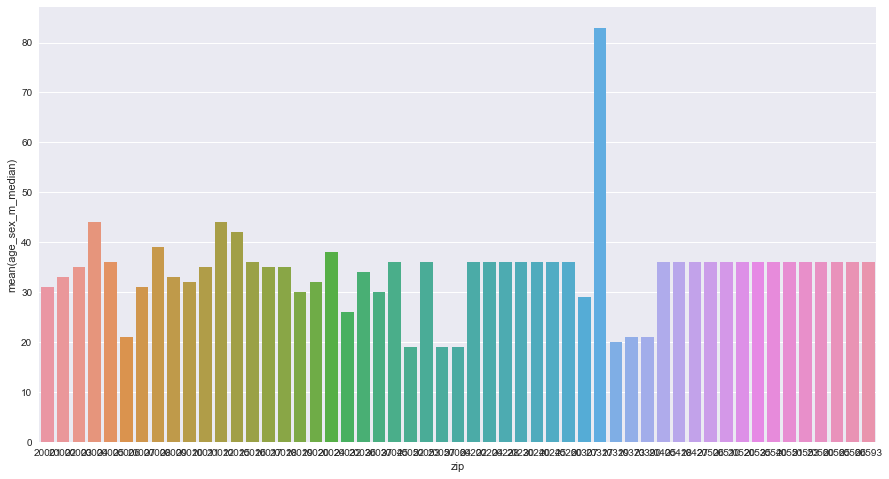

In [164]:
plt.figure(figsize=(15, 8))
sns.barplot(x = "zip", y = "age_sex_m_median", data = demos.loc[demos['state'] == 'dc'])

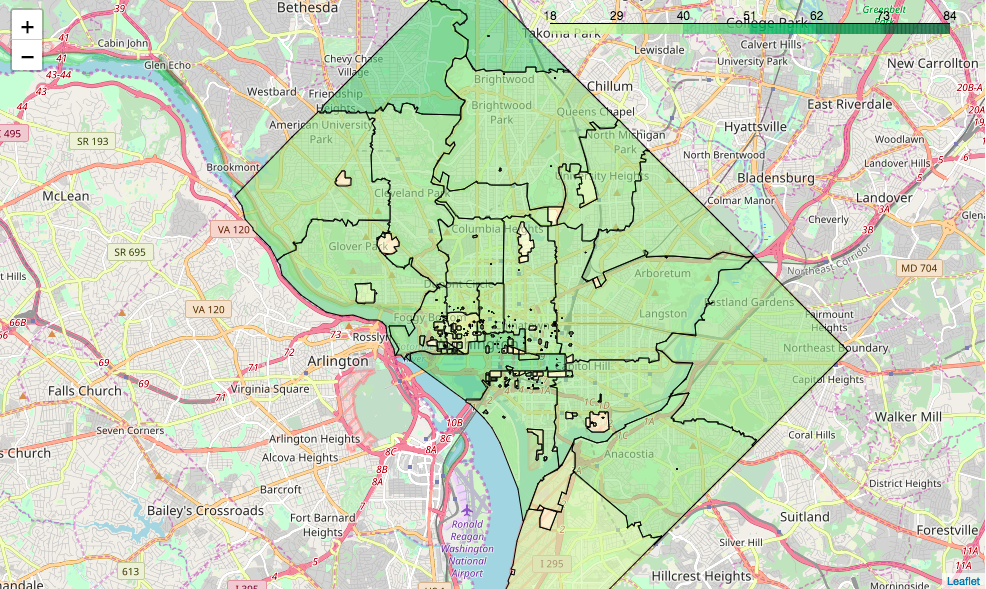

In [176]:
a = folium.Map(location =[38.8977, -77.0365], zoom_start=12)
a.choropleth(geo_data='zip-codes.geojson', data=demos,
            columns=['zip', 'age_sex_m_median'],
            key_on='feature.properties.ZIPCODE',
            #threshold_scale=[0, 10000, 20000, 30000, 40000, 50000, 60000, 80000, 90000],
            fill_color='YlGn')
a

from IPython.display import Image
file = '/Users/sanemkabaca/Desktop/'
Image(filename=file + 'median_male.png')

## Median female age

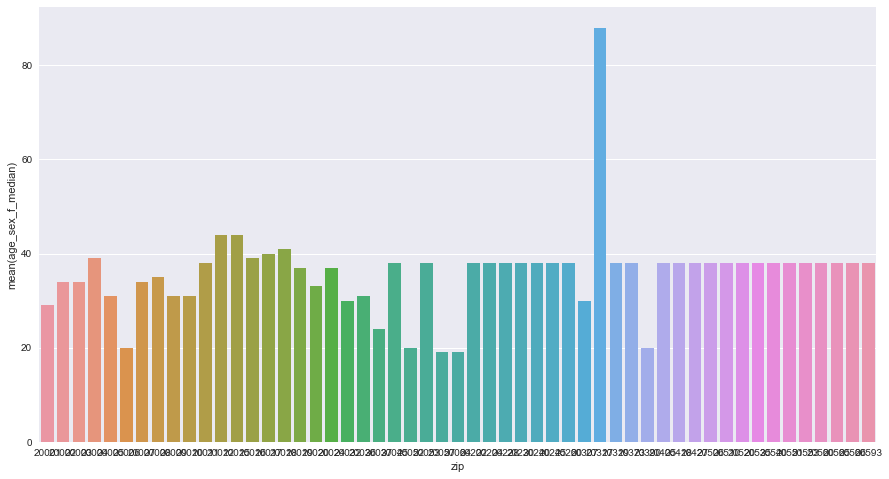

In [166]:
plt.figure(figsize=(15, 8))
sns.barplot(x = "zip", y = "age_sex_f_median", data = demos.loc[demos['state'] == 'dc'])

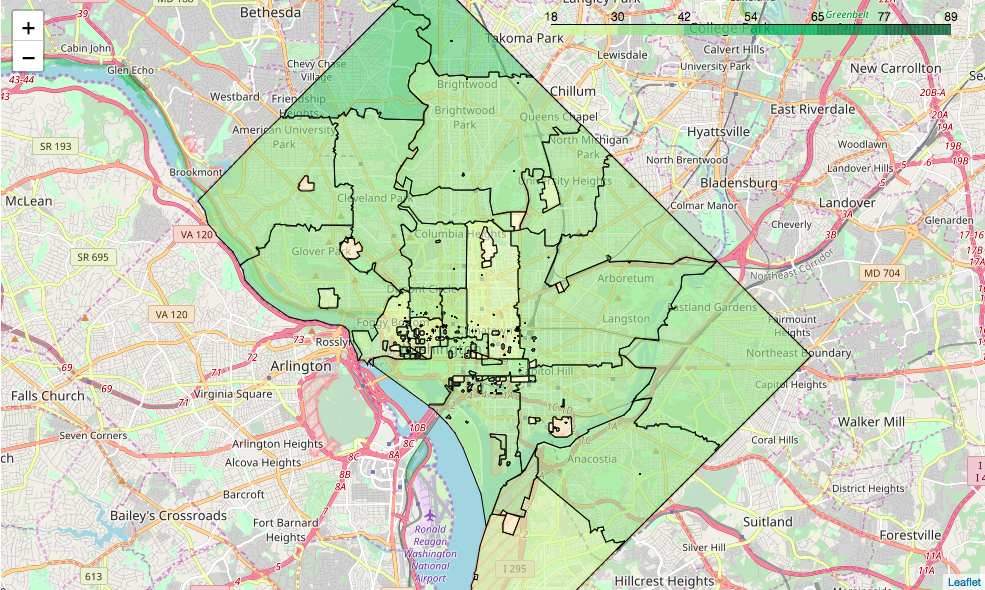

In [177]:
c = folium.Map(location =[38.8977, -77.0365], zoom_start=12)
c.choropleth(geo_data='zip-codes.geojson', data=demos,
            columns=['zip', 'age_sex_f_median'],
            key_on='feature.properties.ZIPCODE',
            #threshold_scale=[0, 10000, 20000, 30000, 40000, 50000, 60000, 80000, 90000],
            fill_color='YlGn')
c

from IPython.display import Image
file = '/Users/sanemkabaca/Desktop/'
Image(filename=file + 'median_female.png')

## DC Education: 25 or older with a bachelor's degree

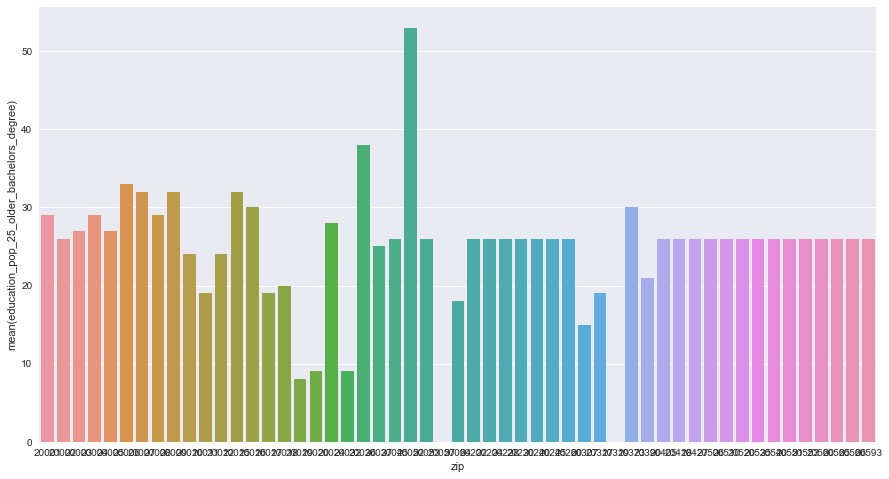

In [169]:
plt.figure(figsize=(15, 8))
sns.barplot(x = "zip", y = "education_pop_25_older_bachelors_degree", data = demos.loc[demos['state'] == 'dc'])

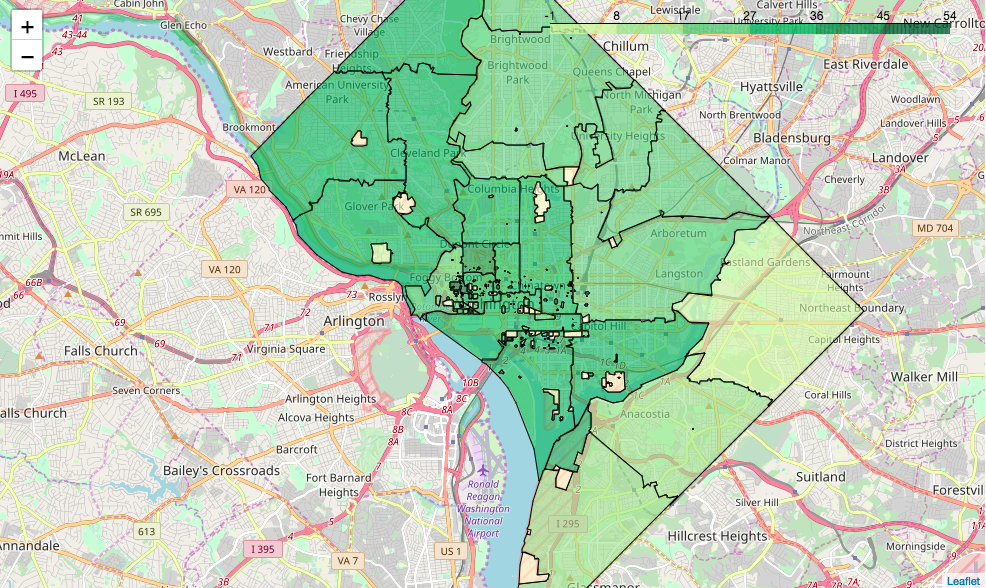

In [178]:
d = folium.Map(location =[38.8977, -77.0365], zoom_start=12)
d.choropleth(geo_data='zip-codes.geojson', data=demos,
            columns=['zip', 'education_pop_25_older_bachelors_degree'],
            key_on='feature.properties.ZIPCODE',
            #threshold_scale=[0, 10000, 20000, 30000, 40000, 50000, 60000, 80000, 90000],
            fill_color='YlGn')
d

from IPython.display import Image
file = '/Users/sanemkabaca/Desktop/'
Image(filename=file + 'bachelors.png')

## DC: Percent of population with health insurance

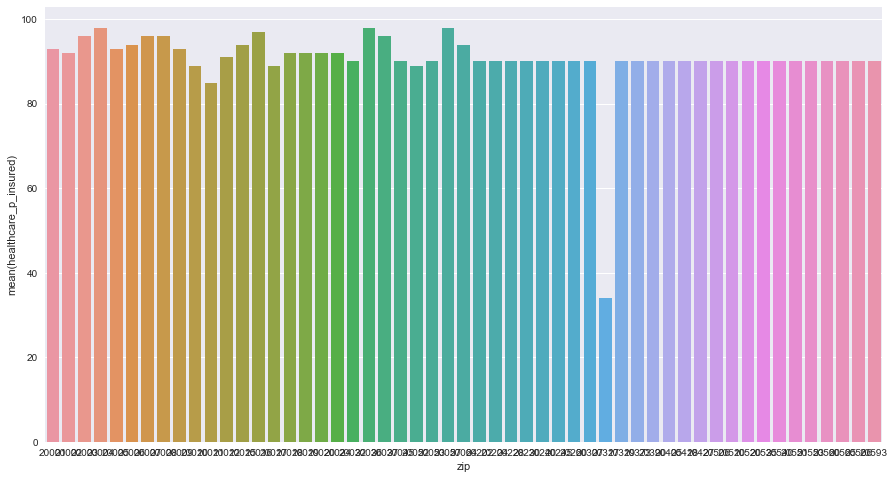

In [171]:
plt.figure(figsize=(15, 8))
sns.barplot(x = "zip", y = "healthcare_p_insured", data = demos.loc[demos['state'] == 'dc'])

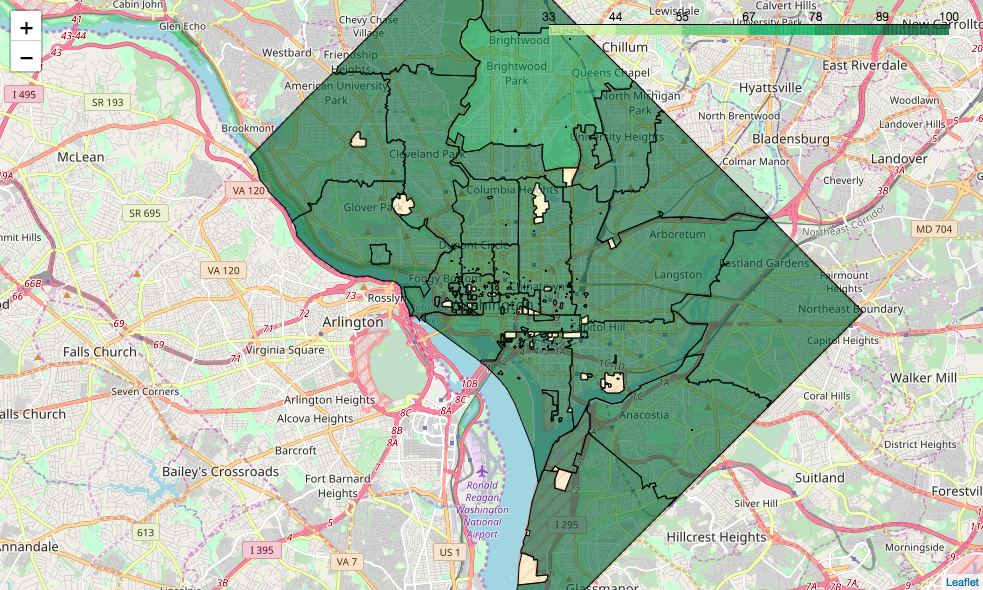

In [179]:
e = folium.Map(location =[38.8977, -77.0365], zoom_start=12)
e.choropleth(geo_data='zip-codes.geojson', data=demos,
            columns=['zip', 'healthcare_p_insured'],
            key_on='feature.properties.ZIPCODE',
            #threshold_scale=[0, 10000, 20000, 30000, 40000, 50000, 60000, 80000, 90000],
            fill_color='YlGn')
e

from IPython.display import Image
file = '/Users/sanemkabaca/Desktop/'
Image(filename=file + 'insurance.png')

## DC percent of population that is single

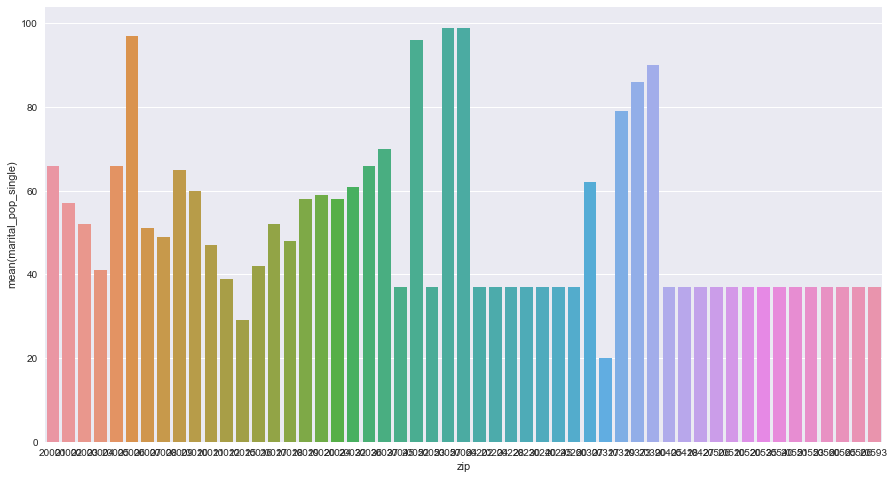

In [173]:
plt.figure(figsize=(15, 8))
sns.barplot(x = "zip", y = "marital_pop_single", data = demos.loc[demos['state'] == 'dc'])

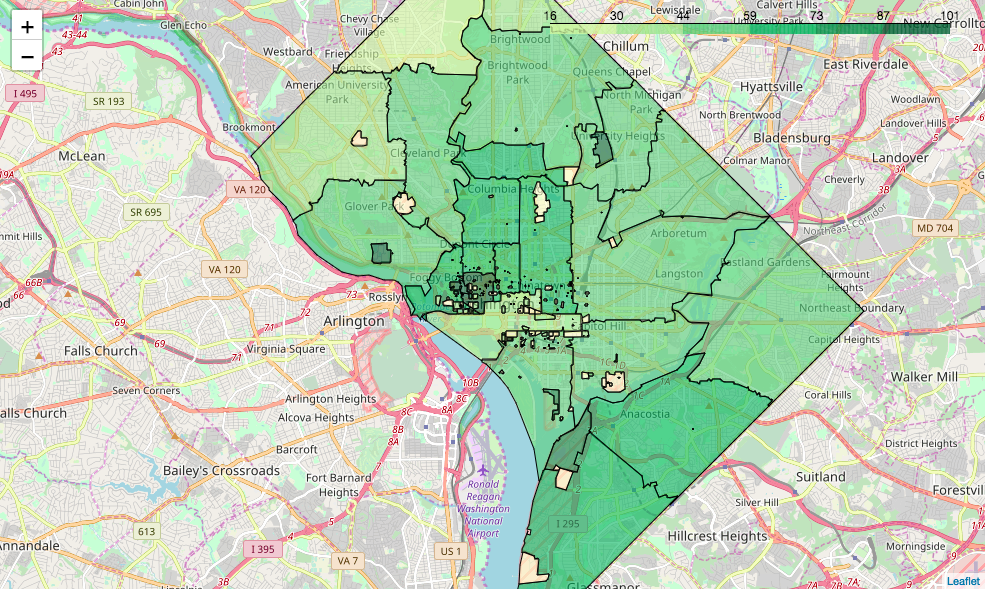

In [180]:
f = folium.Map(location =[38.8977, -77.0365], zoom_start=12)
f.choropleth(geo_data='zip-codes.geojson', data=demos,
            columns=['zip', 'marital_pop_single'],
            key_on='feature.properties.ZIPCODE',
            #threshold_scale=[0, 10000, 20000, 30000, 40000, 50000, 60000, 80000, 90000],
            fill_color='YlGn')
f

from IPython.display import Image
file = '/Users/sanemkabaca/Desktop/'
Image(filename=file + 'single.png')

# Google Vision API

In [ ]:
pd.isnull(df_units.minrent).sum()

In [9]:
# Import required packages and functions
import io
import os
import pandas as pd
from google.cloud import vision
from google.cloud.vision import types

# Set Google API authentication and set folder where images are stored
os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = 'PATH TO JSON FILE'
ImageFolder = 'PATH TO DIRECTORY WHERE IMAGES ARE STORED'

# Placeholders to store data
ImageID = []
MID = []
Description = []
Score = []

# Create empty data frame and vision API client
ImageLabels = pd.DataFrame()
client = vision.ImageAnnotatorClient()

# Get labels and scores for every image in folder
for file in os.listdir(ImageFolder):
    filename = os.path.basename(file).split('.')[0] # Get image ID
    image_file = io.open(ImageFolder+file, 'rb') # Open image
    content = image_file.read() # Read image into memory
    image = types.Image(content=content) # Does something
    response = client.label_detection(image=image) # Gets response from API for image
    labels = response.label_annotations # Get labels from response
    Nlabels = len(labels) # Get the number of labels that were returned
    for i in range(0, Nlabels): # For each label we will store the MID, label, and score
        ImageID.append(filename) # Keep track Image ID
        MID.append(labels[i].mid) # Store MID
        Description.append(labels[i].description) # Store label
        Score.append(labels[i].score) # Store score of label

# Put Image ID, MID, label, and score into data frame
ImageLabels["imageid"] = ImageID
ImageLabels["mid"] = MID
ImageLabels["desc"] = Description
ImageLabels["score"] = Score

ModuleNotFoundError: No module named 'google.cloud'

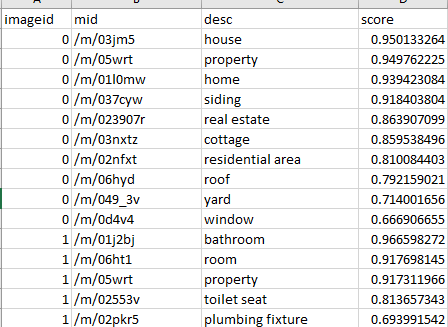

In [11]:
from IPython.display import Image
file = 'C:\\Users\\NKallfa\\Desktop\\Documents\\Georgetown Data Science Certificate\\DMV\\presentation\\images\\'
Image(filename=file + 'Image_Labels_From_Google.png')

## CNN Stuff
Found a tutorial (https://www.tensorflow.org/tutorials/image_recognition) on how to use a pre-trained CNN to train an image classifier. Decided to follow this tutorial using images I downloaded to classify an image as being one of:

1.  bathroom 
2. bedroom 
3. floorplan 
4. homes  
5. kitchen

These were the 5 most common labels that came from the Google Vision API. Ultimately trained the model on 12,500 (2,500 from each class) 100×100 color images and it took about 1 hour to run. Some labels were much more common than others (10,000 houses, but only 2,500 bedrooms). I wanted to keep the size of each class the same so I ended up just using 2,500 images for each class. This was a straightforward application of CNNs...I also wanted to see if I could classify an image of an apartment as being above/below average rent.  

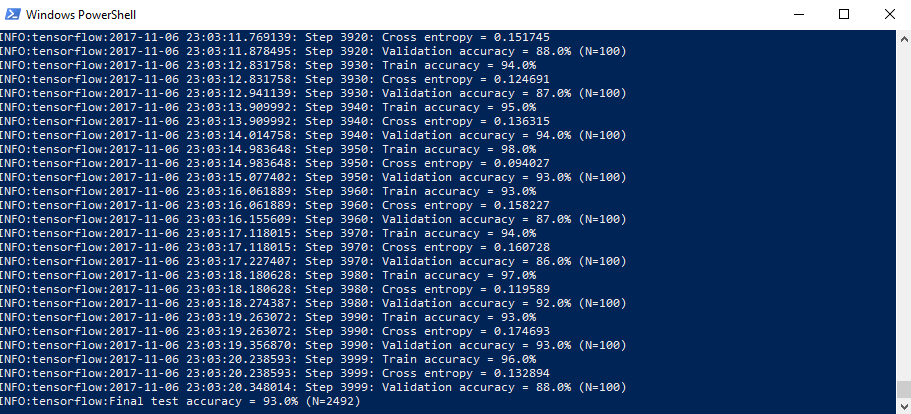

In [12]:
from IPython.display import Image
file = 'C:\\Users\\NKallfa\\Desktop\\Documents\\Georgetown Data Science Certificate\\DMV\\presentation\\images\\'
Image(filename=file + 'Output_From_CNN_Training.png')

In [4]:
python label_image.py --graph=C:\Users\NKallfa\Desktop\CNN_Models\Pretrained\Class5\output_graph.pb --labels=C:\Users\NKallfa\Desktop\CNN_Models\Pretrained\Class5\output_labels.txt --image=C:\Users\NKallfa\Desktop\CNN\kitch3.jpg

SyntaxError: invalid syntax (<ipython-input-4-d6c6191239b2>, line 1)

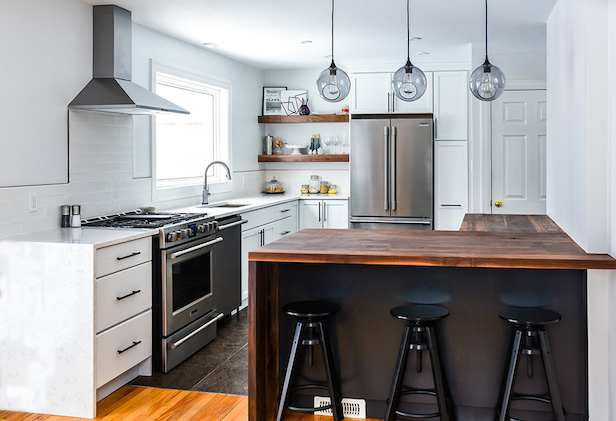

In [5]:
from IPython.display import Image
file = 'C:\\Users\\NKallfa\\Desktop\\CNN\\'
Image(filename=file + 'kitch3.jpg')

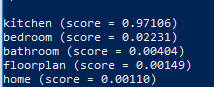

In [6]:
from IPython.display import Image
file = 'C:\\Users\\NKallfa\\Desktop\\Documents\\Georgetown Data Science Certificate\\DMV\\presentation\\images\\'
Image(filename=file + 'score.png')

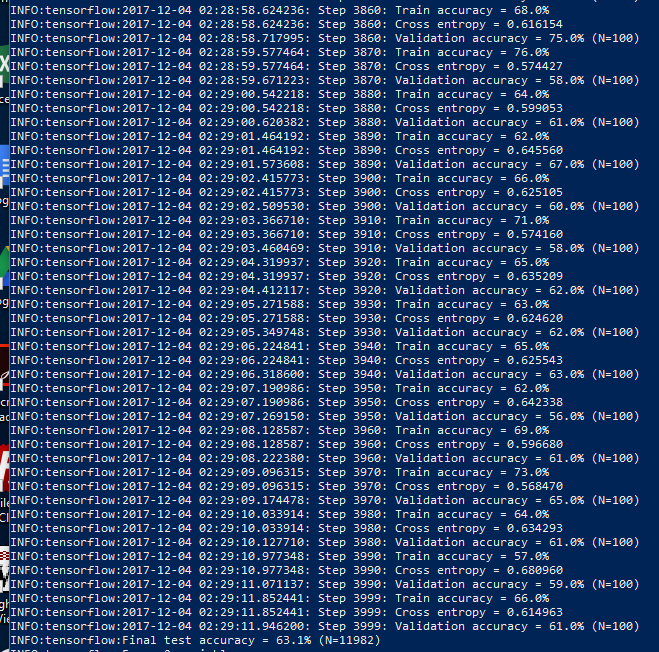

In [8]:
from IPython.display import Image
file = 'C:\\Users\\NKallfa\\Desktop\\Documents\\Georgetown Data Science Certificate\\DMV\\presentation\\images\\'
Image(filename=file + 'Above_Below_Avg_Rent.png')

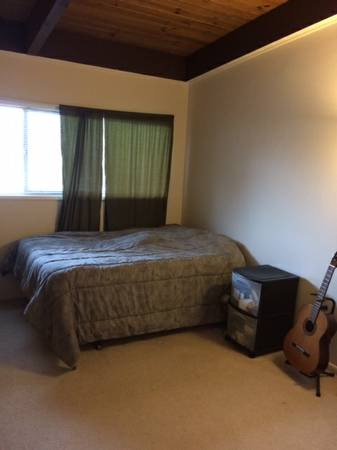

In [1]:
from IPython.display import Image
file = 'C:\\Users\\NKallfa\\Desktop\\CNN\\'
Image(filename=file + 'Below2.jpg')

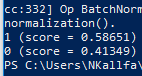

In [2]:
from IPython.display import Image
file = 'C:\\Users\\NKallfa\\Desktop\\Documents\\Georgetown Data Science Certificate\\DMV\\presentation\\images\\'
Image(filename=file + 'score_rent.png')